In [96]:
import pandas as pd
import numpy as np
from matplotlib import style
import folium
import math
from matplotlib import pyplot as plt
import pandas.api.types as ptypes
%matplotlib inline
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
import pickle

Df_dataset = pd.read_csv('./DataSets/cleaned_dataset.csv')

In [97]:
#Get all the listings to a map
loc_center = [Df_dataset['latitude'].mean(),Df_dataset['longitude'].mean()]

map1 = folium.Map(location = loc_center, tiles='Openstreetmap', zoom_start = 12, control_scale=True)

for index, loc in Df_dataset.iterrows():
    folium.CircleMarker([loc['latitude'], loc['longitude']],     radius=2, weight=5, popup=loc['neighbourhood']).add_to(map1)

folium.LayerControl().add_to(map1)

map1

In [98]:
# To Calculate Distance

def hd(latitude_1, longitude_1, latitude_2, longitude_2):
    # Earth's mean radius
    r = 6371 # km
    
    alfa_1 = math.radians(latitude_1)
    alfa_2 = math.radians(latitude_2)
    
    delta_alfa = math.radians(latitude_2 - latitude_1)
    delta_beta = math.radians(longitude_2 - longitude_1)
    
    a = math.sin(delta_alfa/2)**2 + math.cos(alfa_1) * math.cos(alfa_2) * math.sin(delta_beta/2)**2
    c = 2* math.asin(math.sqrt(a))    
    A = (r*c)
    return A

In [99]:
#Places near Fenway park
for index, loc in Df_dataset.iterrows():
  lon= loc["longitude"]
  lat= loc["latitude"]
 
  z=hd(42.346, -71.0972, lat,lon)

  if z <= 0.5:                
    folium.CircleMarker([lon, lat], radius=2, weight=5, popup=loc['neighbourhood']).add_to(map1)
 
folium.LayerControl().add_to(map1)

map1

In [100]:
#Get fenway park listings to a data frame
main_list = []

for index in range(len(Df_dataset)):
  latitude = Df_dataset.iloc[index, 1]
  longitude = Df_dataset.iloc[index, 2]
  
  
  distance = hd(42.3467, -71.0972, latitude, longitude)
  
  if distance <= 0.5: # --> if distance less than 500m <--
    main_list.append(list(Df_dataset.loc[index])) 

In [101]:
Df_nearest = pd.DataFrame(main_list, columns=['host_id','latitude','longitude','room_type','price','number_of_reviews','review_scores_value','neighbourhood'])
Df_nearest

,host_id,latitude,longitude,room_type,price,number_of_reviews,review_scores_value,neighbourhood
0,71965368.0,42.346489,-71.092146,2.0,45.0,2.0,0.0,10.0
1,25188.0,42.345009,-71.098724,2.0,249.0,1.0,8.0,10.0
2,25188.0,42.343922,-71.097201,1.0,349.0,4.0,9.0,10.0
3,25188.0,42.343471,-71.100383,1.0,39.0,1.0,0.0,10.0
4,25188.0,42.344865,-71.102600,1.0,349.0,9.0,9.0,10.0
...,...,...,...,...,...,...,...,...
148,30283594.0,42.345234,-71.100379,1.0,319.0,0.0,0.0,10.0
149,4121218.0,42.346686,-71.098528,1.0,31.0,12.0,9.0,10.0
150,41720242.0,42.347962,-71.097064,2.0,15.0,8.0,9.0,10.0
151,9967305.0,42.342703,-71.096238,1.0,115.0,43.0,8.0,10.0


In [102]:
Df_nearest.info()
Df_nearest.drop_duplicates()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153 entries, 0 to 152
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   host_id              153 non-null    float64
 1   latitude             153 non-null    float64
 2   longitude            153 non-null    float64
 3   room_type            153 non-null    float64
 4   price                153 non-null    float64
 5   number_of_reviews    153 non-null    float64
 6   review_scores_value  153 non-null    float64
 7   neighbourhood        153 non-null    float64
dtypes: float64(8)
memory usage: 9.7 KB


,host_id,latitude,longitude,room_type,price,number_of_reviews,review_scores_value,neighbourhood
0,71965368.0,42.346489,-71.092146,2.0,45.0,2.0,0.0,10.0
1,25188.0,42.345009,-71.098724,2.0,249.0,1.0,8.0,10.0
2,25188.0,42.343922,-71.097201,1.0,349.0,4.0,9.0,10.0
3,25188.0,42.343471,-71.100383,1.0,39.0,1.0,0.0,10.0
4,25188.0,42.344865,-71.102600,1.0,349.0,9.0,9.0,10.0
...,...,...,...,...,...,...,...,...
148,30283594.0,42.345234,-71.100379,1.0,319.0,0.0,0.0,10.0
149,4121218.0,42.346686,-71.098528,1.0,31.0,12.0,9.0,10.0
150,41720242.0,42.347962,-71.097064,2.0,15.0,8.0,9.0,10.0
151,9967305.0,42.342703,-71.096238,1.0,115.0,43.0,8.0,10.0


In [103]:
#remove outliers
import pandas.api.types as ptypes
low = .10 #.05
high = .90 #.95
quant_df = Df_nearest.quantile([low, high])
for col_name in list(Df_nearest.columns):
    if ptypes.is_numeric_dtype(Df_nearest['review_scores_value']):
        Df_nearest = Df_nearest[(Df_nearest['review_scores_value'] > quant_df.loc[low, "review_scores_value"]) &
\
        (Df_dataset["review_scores_value"] < quant_df.loc[high, "review_scores_value"])]


/var/folders/gf/9f_82frx1p12dxp9553l18x40000gn/T/ipykernel_25999/1887196046.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Df_nearest = Df_nearest[(Df_nearest['review_scores_value'] > quant_df.loc[low, "review_scores_value"]) &
/var/folders/gf/9f_82frx1p12dxp9553l18x40000gn/T/ipykernel_25999/1887196046.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Df_nearest = Df_nearest[(Df_nearest['review_scores_value'] > quant_df.loc[low, "review_scores_value"]) &
/var/folders/gf/9f_82frx1p12dxp9553l18x40000gn/T/ipykernel_25999/1887196046.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Df_nearest = Df_nearest[(Df_nearest['review_scores_value'] > quant_df.loc[low, "review_scores_value"]) &
/var/folders/gf/9f_82frx1p12dxp9553l18x40000gn/T/ipykernel_25999/1887196046.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Df_nearest = Df_nearest[(Df_nearest['review_s

Text(0, 0.5, 'review_scores_value')

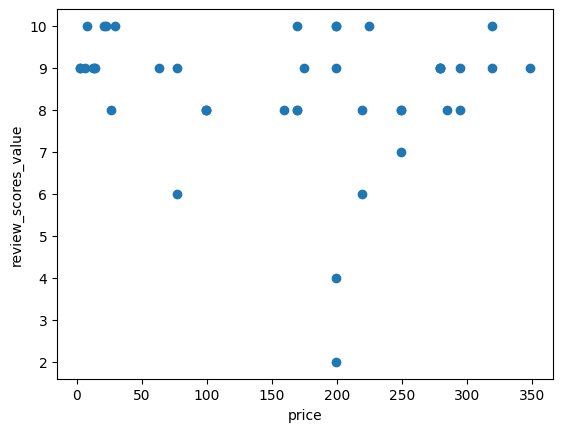

In [104]:
plt.scatter(Df_nearest['price'],Df_nearest['review_scores_value'])
plt.xlabel('price')
plt.ylabel('review_scores_value')

In [105]:
# No of clusters
km = KMeans(4)
km

KMeans(n_clusters=4)

In [106]:
y_predicted = km.fit_predict(Df_nearest[['price','review_scores_value']])
y_predicted

array([0, 1, 3, 1, 0, 3, 1, 0, 0, 3, 3, 0, 2, 0, 2, 0, 0, 1, 2, 2, 3, 3,
       2, 0, 2, 2, 2, 2, 1, 2, 1, 3, 3, 0, 2, 2, 3, 0, 0, 3, 2, 3, 0],
      dtype=int32)

In [107]:
Df_nearest['cluster'] = y_predicted
Df_nearest

,host_id,latitude,longitude,room_type,price,number_of_reviews,review_scores_value,neighbourhood,cluster
1,25188.0,42.345009,-71.098724,2.0,249.0,1.0,8.0,10.0,0
9,324630.0,42.346215,-71.093720,1.0,99.0,184.0,8.0,10.0,1
11,43450256.0,42.348618,-71.092202,1.0,2.0,11.0,9.0,10.0,3
14,324630.0,42.347726,-71.093948,1.0,99.0,252.0,8.0,10.0,1
18,9419684.0,42.344324,-71.099166,1.0,285.0,1.0,8.0,10.0,0
22,24732813.0,42.350601,-71.094751,1.0,14.0,58.0,9.0,10.0,3
26,47492498.0,42.343237,-71.096500,2.0,77.0,32.0,9.0,10.0,1
30,25188.0,42.343624,-71.097928,1.0,349.0,4.0,9.0,10.0,0
32,30283594.0,42.345062,-71.101725,1.0,319.0,1.0,10.0,10.0,0
36,12790789.0,42.344627,-71.094908,3.0,8.0,10.0,10.0,10.0,3


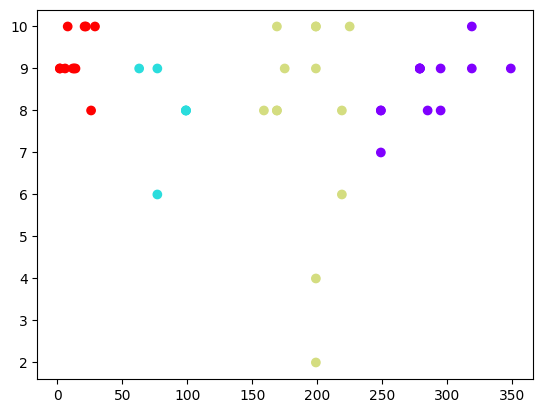

In [108]:
plt.scatter(Df_nearest["price"],Df_nearest["review_scores_value"],c=Df_nearest["cluster"],cmap="rainbow")

In [109]:
scaler = MinMaxScaler()

scaler.fit(Df_nearest[['price']])
Df_nearest['price'] = scaler.transform(Df_nearest[['price']])

scaler.fit(Df_nearest[['review_scores_value']])
Df_nearest['review_scores_value'] = scaler.transform(Df_nearest[['review_scores_value']])

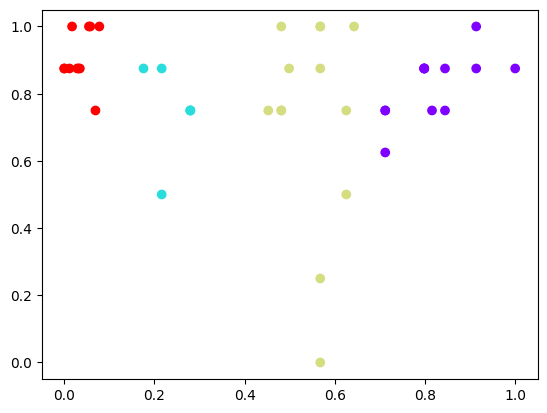

In [110]:
plt.scatter(Df_nearest["price"],Df_nearest["review_scores_value"],c=Df_nearest["cluster"],cmap='rainbow')

In [111]:
km = KMeans(2)

y_predicted = km.fit_predict(Df_nearest[['price','review_scores_value']])
y_predicted

array([1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1],
      dtype=int32)

In [112]:
km.cluster_centers_

array([[0.10764536, 0.85294118],
       [0.68410552, 0.77884615]])

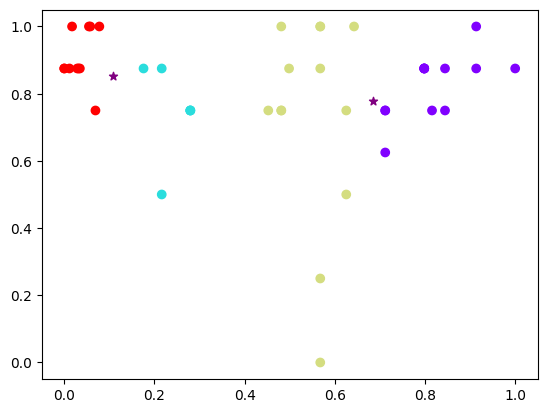

In [113]:
plt.scatter(Df_nearest["price"],Df_nearest["review_scores_value"],c=Df_nearest["cluster"],cmap="rainbow")
#x axis --> km.cluster_centers_[:,0]
#y axis --> km.cluster_cnters_[:,1]
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='purple',marker='*' , label='centroid')

In [114]:
sse =[]
k_rng = range(1,10)
for k in k_rng:
    km=KMeans(n_clusters=k)
    km.fit(Df_nearest[['price','review_scores_value']])
    sse.append(km.inertia_)

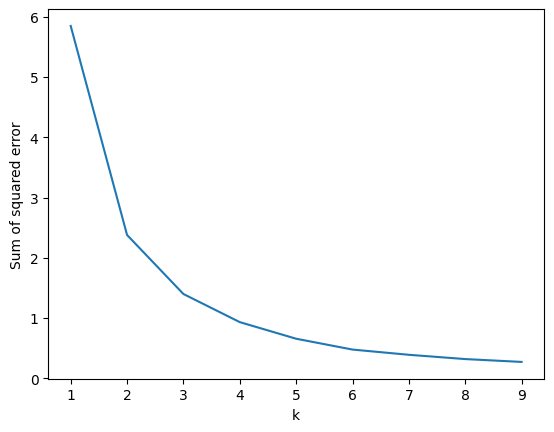

In [115]:
plt.xlabel('k')
plt.ylabel('Sum of squared error')
plt.plot(k_rng,sse)

In [116]:
pickle.dump(km,open('model.pkl','wb'))